**Install requirements**

In [ ]:
!pip install segmentation-models-pytorch
!pip install torchmetrics
!pip install fvcore
!pip install ptflops

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 5.2 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=5810b1ac94cb6e2b7d4bfe981278d98af2a4f18c9e7fa0f787b9c565a0aaee85
  Stored in directory: /root/.cache/pip/wheels/8b/6f/9b/231a832f811ab6ebb1b32455b177ffc6b8b1cd8de19de70c09
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=fda590c82affb584df939d3115f12fbaf5b7abf21443d26acb55fbb19bca0ba0
  Stored in directory: /root/.cache/pip/wheels/5f/5b/96/fd94bc35962d7c6b699e8814db545155ac91d2b95785e1b035
Successfully built efficientnet-pytorch pretrainedmodels
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB

**Import libraries**

In [ ]:
import os

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import numpy as np

from PIL import Image
from tqdm import tqdm
from sklearn.metrics import jaccard_score

import time

from collections import OrderedDict
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# **Global variables**

In [ ]:
NUM_CLASSES = 7

BATCH_SIZE = 16       # Higher batch sizes allows for larger learning rates. An empirical heuristic suggests that, when changing
                      # the batch size, learning rate should change by the same factor to have comparable results

LR = 0.01             # The initial Learning Rate
MOMENTUM = 0.9        # Hyperparameter for SGD, keep this at 0.9 when using SGD
WEIGHT_DECAY = 0.0001 # Regularization, you can keep this at the default

NUM_EPOCHS = 20       # Total number of training epochs (iterations over dataset)

STEP_SIZE = [10, 15]    # How many epochs before decreasing learning rate (if using a step-down policy)
GAMMA = 0.1             # Multiplicative factor for learning rate step-down

# **Dataset management**

**Download Dataset LoveDA**


In [ ]:
#'''
#1yzLCHM-BHGaEvt5DqnCBzaLfLF-qOQ7M
if not os.path.isdir('/content/LoveDA'):
  # Download the LoveDA dataset if it doesn't exist in the directory
  !gdown --id 16syjFlaMnEhXagfcOCrucD8RVFnyqJp7 #1yzLCHM-BHGaEvt5DqnCBzaLfLF-qOQ7M # Estimated time: 3-5 minutes
  !jar xvf  "/content/LoveDA.zip" # Extract the file

# Check
if not os.path.isdir('/content/LoveDA'):
    print("Dataset doesn't exist")

#Weignts
if not os.path.isfile("/content/PIDNet_S_ImageNet.pth.tar"):
  !gdown --id 1reDp2XdraXqPHXvmZvIXzXN8lrTphPk8

if not os.path.isfile("/content/best_model_image_to_image_optFocalLoss_multiStepLR.pth"):
  !gdown --id 1WsvQNkEY5ecZLC5AqhOBmdHvx_gAOoOi

#Util
if not os.path.isfile("/content/model_utils.py"):
  !gdown --id 1Uq3E3F6fO7qXInkS2IFGHS5WDxrrNSpr

'''
# OPTION 2
# Download LoveDA train an val dataset, from https://zenodo.org/records/5706578, extract and put them in a unique folder: LoveDA
# Download the Utils folder from github: https://github.com/Zafonte/Real-time-Domain-Adaptation-in-Semantic-Segmentation.git
# Upload in your drive the dataset and the Utils folder - then run the following line of code
from google.colab import drive
drive.mount('/content/drive')

# Copy the dataset from your Google Drive folder to /content
if not os.path.isdir('/content/LoveDA'):
    !cp -r "/content/drive/MyDrive/AMLProjectCode/LoveDA" /content/     #PUT your path

# Check if the dataset has been copied correctly
if not os.path.isdir('/content/LoveDA'):
    print("Dataset doesn't exist")

#Weights
if not os.path.isfile("/content/PIDNet_S_ImageNet.pth.tar"):
  !cp -r "/content/drive/MyDrive/AMLProjectCode/Utils/PIDNet_S_ImageNet.pth.tar" /content/      #PUT your path

if not os.path.isfile("/content/best_model_image_to_image_optFocalLoss_multiStepLR.pth"):
  !cp -r "/content/drive/MyDrive/AMLProjectCode/Utils/best_model_image_to_image_optFocalLoss_multiStepLR.pth" /content/      #PUT your path

# Utilities
if not os.path.isfile("/content/model_utils.py"):
    !cp -r "/content/drive/MyDrive/AMLProjectCode/Utils/model_utils.py" /content/     #PUT your path
'''

Mounted at /content/drive


**LoveDA dataset class**


In [ ]:
COLOR_MAP = OrderedDict(
    Black = (0, 0, 0),
    Background=(255, 255, 255),
    Building=(255, 0, 0),
    Road=(255, 255, 0),
    Water=(0, 0, 255),
    Barren=(159, 129, 183),
    Forest=(0, 255, 0),
    Agricultural=(255, 195, 128),
)


LABEL_MAP = OrderedDict(
    Black = -1,
    Background=0,
    Building=1,
    Road=2,
    Water=3,
    Barren=4,
    Forest=5,
    Agricultural=6
)


def map_labels(label):
    mapped_label = np.where(label == 0, -1, np.where(label >= 1, label - 1, label)) #change the value of pixel
    return torch.tensor(mapped_label, dtype=torch.long)

class LoveDADataset(Dataset):
    def __init__(self, images_path, masks_path=None, image_transform=None, mask_transform=None):
        self.images_path = images_path
        self.masks_path = masks_path
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.images = sorted([f for f in os.listdir(images_path) if f.endswith('.png')])

        if masks_path:
            self.masks = sorted([f for f in os.listdir(masks_path) if f.endswith('.png')])
            if len(self.images) != len(self.masks):
                raise ValueError("The number of images and masks does not match!")
        else:
            self.masks = None

    def __getitem__(self, idx):
        image = Image.open(os.path.join(self.images_path, self.images[idx])).convert('RGB')
        if self.image_transform:
            image = self.image_transform(image)

        if self.masks:
            mask = Image.open(os.path.join(self.masks_path, self.masks[idx]))
            if self.mask_transform:
                mask = self.mask_transform(mask)
            mask_np = np.array(mask, dtype=np.int64)
            mask_mapped = map_labels(mask_np)
            return image, mask_mapped

        # For the target domain, return an empty tensor as a mask
        return image, torch.zeros((1,), dtype=torch.long)

    def __len__(self):
        return len(self.images)


# **Network setup**

**PIDNet**: a real-time segmentation network

In [ ]:
# ------------------------------------------------------------------------------
# Written by Jiacong Xu (jiacong.xu@tamu.edu)
# ------------------------------------------------------------------------------
import sys
import os

from model_utils import BasicBlock, Bottleneck, segmenthead, DAPPM, PAPPM, PagFM, Bag, Light_Bag

import torch
import torch.nn as nn
import torch.nn.functional as F
import time
import logging

BatchNorm2d = nn.BatchNorm2d
bn_mom = 0.1
algc = False

class PIDNet(nn.Module):

    def __init__(self, m=2, n=3, num_classes=NUM_CLASSES, planes=64, ppm_planes=96, head_planes=128, augment=True):
        super(PIDNet, self).__init__()
        self.augment = augment

        # I Branch - extracts key features at reduced resolutions
        self.conv1 =  nn.Sequential(
                          nn.Conv2d(3,planes,kernel_size=3, stride=2, padding=1),
                          BatchNorm2d(planes, momentum=bn_mom),
                          nn.ReLU(inplace=True),
                          nn.Conv2d(planes,planes,kernel_size=3, stride=2, padding=1),
                          BatchNorm2d(planes, momentum=bn_mom),
                          nn.ReLU(inplace=True),
                      )

        self.relu = nn.ReLU(inplace=True)
        self.layer1 = self._make_layer(BasicBlock, planes, planes, m)
        self.layer2 = self._make_layer(BasicBlock, planes, planes * 2, m, stride=2)
        self.layer3 = self._make_layer(BasicBlock, planes * 2, planes * 4, n, stride=2)
        self.layer4 = self._make_layer(BasicBlock, planes * 4, planes * 8, n, stride=2)
        self.layer5 =  self._make_layer(Bottleneck, planes * 8, planes * 8, 2, stride=2)

        # P Branch - optimized for scene parsing
        self.compression3 = nn.Sequential(
                                          nn.Conv2d(planes * 4, planes * 2, kernel_size=1, bias=False),
                                          BatchNorm2d(planes * 2, momentum=bn_mom),
                                          )

        self.compression4 = nn.Sequential(
                                          nn.Conv2d(planes * 8, planes * 2, kernel_size=1, bias=False),
                                          BatchNorm2d(planes * 2, momentum=bn_mom),
                                          )
        self.pag3 = PagFM(planes * 2, planes)
        self.pag4 = PagFM(planes * 2, planes)

        self.layer3_ = self._make_layer(BasicBlock, planes * 2, planes * 2, m)
        self.layer4_ = self._make_layer(BasicBlock, planes * 2, planes * 2, m)
        self.layer5_ = self._make_layer(Bottleneck, planes * 2, planes * 2, 1)

        # D Branch - captures fine details (edges, contours)
        if m == 2:
            self.layer3_d = self._make_single_layer(BasicBlock, planes * 2, planes)
            self.layer4_d = self._make_layer(Bottleneck, planes, planes, 1)
            self.diff3 = nn.Sequential(
                                        nn.Conv2d(planes * 4, planes, kernel_size=3, padding=1, bias=False),
                                        BatchNorm2d(planes, momentum=bn_mom),
                                        )
            self.diff4 = nn.Sequential(
                                     nn.Conv2d(planes * 8, planes * 2, kernel_size=3, padding=1, bias=False),
                                     BatchNorm2d(planes * 2, momentum=bn_mom),
                                     )
            self.spp = PAPPM(planes * 16, ppm_planes, planes * 4)
            self.dfm = Light_Bag(planes * 4, planes * 4)
        else:
            self.layer3_d = self._make_single_layer(BasicBlock, planes * 2, planes * 2)
            self.layer4_d = self._make_single_layer(BasicBlock, planes * 2, planes * 2)
            self.diff3 = nn.Sequential(
                                        nn.Conv2d(planes * 4, planes * 2, kernel_size=3, padding=1, bias=False),
                                        BatchNorm2d(planes * 2, momentum=bn_mom),
                                        )
            self.diff4 = nn.Sequential(
                                     nn.Conv2d(planes * 8, planes * 2, kernel_size=3, padding=1, bias=False),
                                     BatchNorm2d(planes * 2, momentum=bn_mom),
                                     )
            self.spp = DAPPM(planes * 16, ppm_planes, planes * 4)
            self.dfm = Bag(planes * 4, planes * 4)

        self.layer5_d = self._make_layer(Bottleneck, planes * 2, planes * 2, 1)

        # Prediction Head
        if self.augment:
            self.seghead_p = segmenthead(planes * 2, head_planes, num_classes)
            self.seghead_d = segmenthead(planes * 2, planes, 1)

        self.final_layer = segmenthead(planes * 4, head_planes, num_classes)


        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)


    def _make_layer(self, block, inplanes, planes, blocks, stride=1):
        downsample = None
        if stride != 1 or inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion, momentum=bn_mom),
            )

        layers = []
        layers.append(block(inplanes, planes, stride, downsample))
        inplanes = planes * block.expansion
        for i in range(1, blocks):
            if i == (blocks-1):
                layers.append(block(inplanes, planes, stride=1, no_relu=True))
            else:
                layers.append(block(inplanes, planes, stride=1, no_relu=False))

        return nn.Sequential(*layers)

    def _make_single_layer(self, block, inplanes, planes, stride=1):
        downsample = None
        if stride != 1 or inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion, momentum=bn_mom),
            )

        layer = block(inplanes, planes, stride, downsample, no_relu=True)

        return layer

    def forward(self, x):

        width_output = x.shape[-1] // 8
        height_output = x.shape[-2] // 8

        x = self.conv1(x)
        x = self.layer1(x)
        x = self.relu(self.layer2(self.relu(x)))
        x_ = self.layer3_(x)
        x_d = self.layer3_d(x)

        x = self.relu(self.layer3(x))
        x_ = self.pag3(x_, self.compression3(x))
        x_d = x_d + F.interpolate(
                        self.diff3(x),
                        size=[height_output, width_output],
                        mode='bilinear', align_corners=algc)
        if self.augment:
            temp_p = x_

        x = self.relu(self.layer4(x))
        x_ = self.layer4_(self.relu(x_))
        x_d = self.layer4_d(self.relu(x_d))

        x_ = self.pag4(x_, self.compression4(x))
        x_d = x_d + F.interpolate(
                        self.diff4(x),
                        size=[height_output, width_output],
                        mode='bilinear', align_corners=algc)
        if self.augment:
            temp_d = x_d

        x_ = self.layer5_(self.relu(x_))
        x_d = self.layer5_d(self.relu(x_d))
        x = F.interpolate(
                        self.spp(self.layer5(x)),
                        size=[height_output, width_output],
                        mode='bilinear', align_corners=algc)

        x_ = self.final_layer(self.dfm(x_, x, x_d))

        if self.augment:
            x_extra_p = self.seghead_p(temp_p)
            x_extra_d = self.seghead_d(temp_d)
            return [x_extra_p, x_, x_extra_d]
        else:
            return x_

def get_seg_model(cfg, imgnet_pretrained):

    if 's' in cfg.MODEL.NAME:
        model = PIDNet(m=2, n=3, num_classes=cfg.DATASET.NUM_CLASSES, planes=32, ppm_planes=96, head_planes=128, augment=False)
    elif 'm' in cfg.MODEL.NAME:
        model = PIDNet(m=2, n=3, num_classes=cfg.DATASET.NUM_CLASSES, planes=64, ppm_planes=96, head_planes=128, augment=True)
    else:
        model = PIDNet(m=3, n=4, num_classes=cfg.DATASET.NUM_CLASSES, planes=64, ppm_planes=112, head_planes=256, augment=True)

    if imgnet_pretrained:
        print('PIDNet-S backbone pretraining on ImageNet loading...')
        pretrained_state = torch.load(cfg.MODEL.PRETRAINED, map_location='cpu')['state_dict']
        model_dict = model.state_dict()
        pretrained_state = {k: v for k, v in pretrained_state.items() if (k in model_dict and v.shape == model_dict[k].shape)}
        model_dict.update(pretrained_state)
        msg = 'Loaded {} parameters!'.format(len(pretrained_state))
        logging.info('Attention!!!')
        logging.info(msg)
        logging.info('Over!!!')
        model.load_state_dict(model_dict, strict = False)
        print('PIDNet-S backbone pretraining on ImageNet LOADED')
    else:
        pretrained_dict = torch.load(cfg.MODEL.PRETRAINED, map_location='cpu')
        if 'state_dict' in pretrained_dict:
            pretrained_dict = pretrained_dict['state_dict']
        model_dict = model.state_dict()
        pretrained_dict = {k[6:]: v for k, v in pretrained_dict.items() if (k[6:] in model_dict and v.shape == model_dict[k[6:]].shape)}
        msg = 'Loaded {} parameters!'.format(len(pretrained_dict))
        logging.info('Attention!!!')
        logging.info(msg)
        logging.info('Over!!!')
        model_dict.update(pretrained_dict)
        model.load_state_dict(model_dict, strict = False)

    return model

def get_pred_model(name, num_classes):

    if 's' in name:
        model = PIDNet(m=2, n=3, num_classes=num_classes, planes=32, ppm_planes=96, head_planes=128, augment=False)
    elif 'm' in name:
        model = PIDNet(m=2, n=3, num_classes=num_classes, planes=64, ppm_planes=96, head_planes=128, augment=False)
    else:
        model = PIDNet(m=3, n=4, num_classes=num_classes, planes=64, ppm_planes=112, head_planes=256, augment=False)

    return model


In [ ]:
# Configuration with the path to the pre-trained file
class Config:
    class MODEL:
        NAME = 's'  # Specify the pattern ('s', 'm', etc.)
        PRETRAINED = '/content/PIDNet_S_ImageNet.pth.tar'  # Path to the PIDNet_S file pretrained on ImageNet

    class DATASET:
        NUM_CLASSES = NUM_CLASSES


# **Visualize prediction functions**

In [ ]:
def visualize_prediction(image, true_mask, pred_mask):
    """
    View original image, true mask and predicted mask.
    Parameters:
    - image: Image tensor (C, H, W).
    - true_mask: True mask tensor.
    - pred_mask: Predicted mask tensor.
    """

    print("True mask and prediction comparison for a train sample image:")

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    image = image.cpu().numpy().transpose(1, 2, 0)  # Change image shape for matplotlib

    # If the image has been normalized for the model, we need to de-normalize it
    # De-normalize the image
    image = image * std + mean  # Inverse of normalization
    image = np.clip(image, 0, 1)  # Make sure the values ​​are in the range [0, 1]

    # Convert image and labels to numpy array for display
    true_mask_np = np.array(true_mask.cpu(), dtype=np.int64)
    pred_mask_np = np.array(pred_mask.cpu(), dtype=np.int64)

    # Create a colored mask based on LABEL_MAP and COLOR_MAP
    colored_true_mask = np.zeros((true_mask_np.shape[0], true_mask_np.shape[1], 3), dtype=np.uint8)
    colored_pred_mask = np.zeros((pred_mask_np.shape[0], pred_mask_np.shape[1], 3), dtype=np.uint8)
    for class_name, color in COLOR_MAP.items():
        class_value = LABEL_MAP[class_name]  # Get the numeric value for the class
        colored_true_mask[true_mask_np == class_value] = color  # Apply the correct color
        colored_pred_mask[pred_mask_np == class_value] = color  # Apply the correct color

    # Create the figure with subplots
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # Original Image
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    # True Mask
    ax[1].imshow(colored_true_mask)
    ax[1].set_title('True Mask')
    ax[1].axis('off')
    print(f"Unique (mapped) values ​​of the real mask: {np.unique(true_mask_np)}")

    # Predicted Mask
    ax[2].imshow(colored_pred_mask)
    ax[2].set_title('Predicted Mask')
    ax[2].axis('off')
    print(f"Unique values ​​of the predicted mask: {np.unique(pred_mask_np)}")
    print()

    legend_patches = [mpatches.Patch(color=np.array(color) / 255.0, label=class_name) for class_name, color in COLOR_MAP.items()]
    plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.)
    # Show image
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_mixed_data(mixed_images, mixed_labels, weights, model, device):
    """
    Visualize mixed images, weighted mixed labels, and model predictions.

    Args:
        mixed_images (torch.Tensor): Batch of mixed images [B, C, H, W].
        mixed_labels (torch.Tensor): Corresponding mixed labels [B, H, W].
        weights (torch.Tensor): Confidence weights [B, H, W].
        model (torch.nn.Module): Trained model for predictions.
        device (torch.device): Device to run the model on.
    """

    # Move mixed images to device and perform inference
    model.eval()
    with torch.no_grad():
        mixed_images = mixed_images.to(device)
        preds = model(mixed_images)
        preds = F.interpolate(preds, size=(512, 512), mode='bilinear', align_corners=False)
        preds = torch.argmax(preds, dim=1).cpu()

    # Convert tensors to numpy arrays for visualization
    mixed_images = mixed_images.cpu().numpy().transpose(0, 2, 3, 1)  # Convert to (B, H, W, C)
    mixed_labels = mixed_labels.cpu().numpy()
    preds = preds.numpy()
    weights = weights.cpu().numpy()

    for i in range(min(3, mixed_images.shape[0])):  # Visualize up to 3 samples
        plt.figure(figsize=(15, 5))

        # Display mixed image
        plt.subplot(1, 3, 1)
        img = (mixed_images[i] - mixed_images[i].min()) / (mixed_images[i].max() - mixed_images[i].min())  # Normalize
        plt.imshow(img)
        plt.title("Mixed Image")
        plt.axis('off')

        # Create a weighted colored label mask
        colored_mixed_label = np.zeros((mixed_labels[i].shape[0], mixed_labels[i].shape[1], 3), dtype=np.uint8)

        for class_name, color in COLOR_MAP.items():
            class_value = LABEL_MAP[class_name]  # Get the numeric value for the class
            mask = mixed_labels[i] == class_value
            colored_mixed_label[mask & (weights[i] == 1)] = color  # Apply color where weight is 1

        plt.subplot(1, 3, 2)
        plt.imshow(colored_mixed_label)
        plt.title("Weighted Mixed Label")
        plt.axis('off')

        # Create a colored mask for the predicted labels
        colored_pred_mask = np.zeros((preds[i].shape[0], preds[i].shape[1], 3), dtype=np.uint8)

        for class_name, color in COLOR_MAP.items():
            class_value = LABEL_MAP[class_name]
            colored_pred_mask[preds[i] == class_value] = color  # Apply correct color

        plt.subplot(1, 3, 3)
        plt.imshow(colored_pred_mask)
        plt.title("Model Prediction")
        plt.axis('off')

        legend_color_map = OrderedDict(COLOR_MAP)
        legend_color_map["Prediction\nunder\nconfidence"] = legend_color_map.pop("Black")
        legend_patches = [mpatches.Patch(color=np.array(color) / 255.0, label=class_name) for class_name, color in legend_color_map.items()]
        plt.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.)

        plt.show()

# **Define Data Preprocessing**

In [ ]:
# Image transform
image_transform = transforms.Compose([
    transforms.Resize((512, 512), interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.ToTensor(), # Turn PIL Image to torch.Tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalization - Pre-trained models on ImageNet (such as ResNet101 for DeepLabV2 and PIDNet-S) expect normalized images
])

# Mask transform
mask_transform = transforms.Resize((512, 512), interpolation=transforms.InterpolationMode.NEAREST)

In [ ]:
# Data augmentation
import random
import torchvision.transforms.functional as TF
import torchvision.transforms as T

class DataAugmentation:
    def __init__(self, probability=0.5):
        self.probability = probability
        self.transforms = self.horizontal_flip

    def __call__(self, image, mask):
        if random.random() < self.probability:
            image, mask = self.transforms(image, mask)
        return image, mask

    def horizontal_flip(self, image, mask):
        return TF.hflip(image), TF.hflip(mask)

# **Dataset object**

In [ ]:
from torch.utils.data import Subset

train_dataset_source = LoveDADataset(
    "/content/LoveDA/Train/Urban/images_png",
    "/content/LoveDA/Train/Urban/masks_png",
    image_transform=image_transform,
    mask_transform=mask_transform
)

val_dataset = LoveDADataset(
    "/content/LoveDA/Val/Rural/images_png",
    "/content/LoveDA/Val/Rural/masks_png",
    image_transform=image_transform,
    mask_transform=mask_transform
)

train_dataset_target = LoveDADataset(
    "/content/LoveDA/Train/Rural/images_png",
    image_transform=image_transform
)

max_samples = 128
train_dataset_source_reduced = Subset(train_dataset_source, list(range(min(max_samples, len(train_dataset_source)))))
train_dataset_target_reduced = Subset(train_dataset_target, list(range(min(max_samples, len(train_dataset_target)))))

# **Dataloaders**

In [ ]:
# DataLoader
train_loader_source = DataLoader(train_dataset_source, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True)
train_loader_target = DataLoader(train_dataset_target, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True)

# DataLoader reduced
train_loader_source_reduced = DataLoader(train_dataset_source_reduced, batch_size=16, num_workers=2, shuffle=True)
train_loader_target_reduced = DataLoader(train_dataset_target_reduced, batch_size=16, num_workers=2, shuffle=True)

val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# **Image-to-image approach**

**Class_Mix**

In [ ]:
import torch
import numpy as np

def class_mix_batches(source_batch, source_labels, target_batch, target_pseudo_labels, confidence_weights, avoid_classes=[-1]):
    """
    Seleziona metà delle classi dal dominio source, dando priorità a Barren, Forest e Agricultural.
    Ritaglia i pixel di queste classi e li incolla sul batch target, creando un batch e etichette miscelate.

    Args:
        source_batch (torch.Tensor): Batch di immagini del dominio source. Shape: (N, C, H, W)
        source_labels (torch.Tensor): Etichette del dominio source. Shape: (N, H, W)
        target_batch (torch.Tensor): Batch di immagini del dominio target. Shape: (N, C, H, W)
        target_pseudo_labels (torch.Tensor): Pseudo-etichette del dominio target. Shape: (N, H, W)
        confidence_weights (torch.Tensor): Pesi per le pseudo-etichette target. Shape: (N, H, W)
        avoid_classes (list): Classi da evitare nella miscelazione. Default: [-1]

    Returns:
        mixed_batch (torch.Tensor): Batch di immagini miscelate.
        mixed_labels (torch.Tensor): Etichette miscelate.
        selected_classes (torch.Tensor): Classi selezionate per la miscelazione.
        weights (torch.Tensor): Pesi assegnati a ogni pixel nel mixed_labels.
    """

    # Clone the target batches to avoid in-place modifications
    mixed_batch = target_batch.clone()
    mixed_labels = target_pseudo_labels.clone()

    # Define the priority classes
    priority_classes = [4, 5, 6]  # Assuming Barren=4, Forest=5, Agricultural=6

    # Determine the number of available classes excluding those to avoid
    num_classes = torch.max(source_labels).item() + 1
    available_classes = [i for i in range(num_classes) if i not in avoid_classes]

    # Check if class 0 should be included with a 25% probability
    include_class_0 = np.random.rand() < 0.25
    if include_class_0 and 0 not in available_classes:
        available_classes.append(0)

    # Include the priority classes if available
    selected_classes = list(set(priority_classes) & set(available_classes))

    # Select the remaining number of classes randomly
    remaining_classes = list(set(available_classes) - set(selected_classes))
    num_remaining = max(len(available_classes) // 2 - len(selected_classes), 0)
    selected_classes += np.random.choice(remaining_classes, num_remaining, replace=False).tolist()

    selected_classes = torch.tensor(selected_classes).to(source_labels.device)

    # Create a mask for the selected classes
    selected_class_mask = torch.isin(source_labels, selected_classes)
    selected_image_mask = selected_class_mask.unsqueeze(1).repeat(1, source_batch.size(1), 1, 1)

    # Mixing: replace selected pixels in the target batch with those from the source
    mixed_batch[selected_image_mask] = source_batch[selected_image_mask]
    mixed_labels[selected_class_mask] = source_labels[selected_class_mask]

    # Find black pixels (0,0,0) in the target image
    black_pixel_mask = (target_batch[:, 0, :, :] == 0) & (target_batch[:, 1, :, :] == 0) & (target_batch[:, 2, :, :] == 0)

    # Set the corresponding pixels in mixed_labels to -1
    mixed_labels[black_pixel_mask] = -1

    # Create the weight tensor
    weights = torch.zeros_like(mixed_labels, dtype=torch.float32).to(source_labels.device)

    # Assign weight 1.0 to labels from the source
    weights[selected_class_mask] = 1.0

    # Assign pseudo-label weights to the remaining pixels
    weights[~selected_class_mask] = confidence_weights[~selected_class_mask]

    return mixed_batch, mixed_labels, selected_classes, weights


In [ ]:
def generate_pseudo_labels(outputs, epoch, confidence_threshold=0.7, max_confidence_threshold=0.9):
    """
    Generates pseudo-labels with a dynamically increasing confidence threshold.

    Args:
        outputs (torch.Tensor): Model output tensor of shape [B, C, H, W].
        epoch (int): Current epoch number.
        confidence_threshold (float): Initial confidence threshold.
        NUM_EPOCHS (int): Total number of epochs.
        max_confidence_threshold (float): Maximum confidence threshold.

    Returns:
        pseudo_labels (torch.Tensor): Generated pseudo-labels.
        confidence_weights (torch.Tensor): Binary confidence weights (0 or 1).
    """
    # Linearly increase the threshold up to the maximum confidence threshold
    confidence_threshold = min(confidence_threshold + (max_confidence_threshold - confidence_threshold) * (epoch / NUM_EPOCHS), max_confidence_threshold)

    # Compute probabilities and confidence values
    probabilities = torch.softmax(outputs, dim=1)  # [B, C, H, W]
    confidence, pseudo_labels = torch.max(probabilities, dim=1)

    # Assign weight 1 to pixels with confidence >= threshold, 0 otherwise
    confidence_weights = (confidence >= confidence_threshold).float()

    return pseudo_labels, confidence_weights

# **Prepare network**

In [ ]:
# Create configuration object
cfg = Config()

# Get the model with pretrained weights from ImageNet
model = get_seg_model(cfg, imgnet_pretrained = True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

PIDNet-S backbone pretraining on ImageNet loading...


<ipython-input-17-8498e26dc231>:197: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretrained_state = torch.load(cfg.MODEL.PRETRAINED, map_location='cpu')['state_dict']


PIDNet-S backbone pretraining on ImageNet LOADED


# Class **weights**

In [ ]:
import numpy as np
import torch

def calculate_class_weights(device=device):
    """
    Calcola i pesi delle classi inversamente proporzionali alla loro frequenza nel dataset.

    Argomenti:
    set di dati (Dataset): Il dataset di riferimento.
    num_classes (int): Numero totale di classi.
    dispositivo (str): Dispositivo su cui calcolare i pesi.

    Resi:
    torcia.Tensore: Tensore contenente i pesi per ciascuna classe.
    """
    num_classes = NUM_CLASSES
    class_counts = torch.zeros(num_classes).to(device)
    total_pixels = 0

    for _, mask in tqdm(train_loader_source, desc="Computation of the weights of each class"):
        mask = mask.to(device).squeeze(0)
        for cls in range(num_classes):
            class_counts[cls] += torch.sum(mask == cls)
        total_pixels += mask.numel()

    # To avoid division by zero
    class_freq = class_counts / total_pixels
    class_weights = 1.0 / (class_freq + 1e-6)

    # Normalization of the weights
    class_weights = class_weights / class_weights.sum() * num_classes

    return class_weights, class_freq

weights, class_freq = calculate_class_weights()
print(weights, class_freq)

Computation of the weights of each class: 100%|██████████| 72/72 [01:07<00:00,  1.07it/s]


tensor([0.1159, 0.2650, 0.6063, 1.5264, 0.7412, 0.7109, 3.0342],
       device='cuda:0') tensor([0.4617, 0.2020, 0.0883, 0.0351, 0.0722, 0.0753, 0.0176],
       device='cuda:0')


In [ ]:
#weights result: [0.1166, 0.2659, 0.6086, 1.5109, 0.7446, 0.7193, 3.0340],
#class_freq result: [0.4610, 0.2022, 0.0883, 0.0356, 0.0722, 0.0747, 0.0177]

class_weights = torch.tensor([0.3, 0.5, 0.8, 1.4, 1.2, 1.2, 1.6]).to('cuda')

# **Validation setup**

In [ ]:
# Label mapping, excluding the Black class (index -1)
LABEL = {
    'Background': 0,
    'Building': 1,
    'Road': 2,
    'Water': 3,
    'Barren': 4,
    'Forest': 5,
    'Agricultural': 6
}

# Function to compute the confusion matrix
# a: ground truth, b: predictions, n: number of classes
def fast_hist(a, b, n):
    """
    Computes a confusion matrix between classes.

    Args:
        a (np.array): Ground truth (1D or 2D array).
        b (np.array): Prediction (1D or 2D array).
        n (int): Number of classes

    Returns:
        np.array: n x n confusion matrix.
    """
    # Create a boolean mask for valid values
    k = (a >= 0) & (a < n)

    # Compute the confusion matrix
    return np.bincount(n * a[k].astype(int) + b[k], minlength=n ** 2).reshape(n, n)

# Function to compute per-class IoU
def per_class_iou(hist):
    epsilon = 1e-5  # Small constant to avoid division by zero
    # intersection = diagonal values of the confusion matrix
    return np.diag(hist) / (hist.sum(1) + hist.sum(0) - np.diag(hist) + epsilon)

# Function to compute mIoU on a validation set
def compute_mIoU(model, val_loader, num_classes, device):
    model.eval()
    hist = np.zeros((num_classes, num_classes))

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)

            # Model predictions
            outputs = model(images)
            outputs_resized = F.interpolate(
                outputs,
                size=(512, 512),  # Ensure predictions are 512x512
                mode='bilinear',
                align_corners=False
            )
            preds = torch.argmax(outputs_resized, dim=1)  # Predicted class

            # Resize ground truth masks to 512x512
            masks_resized = F.interpolate(
                masks.unsqueeze(1).float(),
                size=(512, 512),
                mode='nearest'
            ).squeeze(1).long()

            preds = preds.cpu().numpy()
            masks_resized = masks_resized.cpu().numpy()

            # Compute the confusion matrix
            for lt, lp in zip(masks_resized, preds):
                hist += fast_hist(lt.flatten(), lp.flatten(), num_classes)

    iou = per_class_iou(hist)
    mIoU = np.mean(iou)

    # Print IoU per class with class names
    print("IoU per category (%):")
    for class_idx in range(num_classes):
        class_name = list(LABEL.keys())[list(LABEL.values()).index(class_idx)]
        print(f" {class_name}: {iou[class_idx] * 100:.2f}%")
    print()

    print(f"mIoU: {mIoU * 100:.2f}%")
    print()
    return mIoU


### ***FocalLoss***

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=1.0, gamma=2.0, ignore_index=-1):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ignore_index = ignore_index

    def forward(self, inputs, targets, mask=None):
        # Applicare la maschera direttamente ai logit o alle probabilità
        if mask is not None:
            inputs = inputs * mask.unsqueeze(1)  # Espandi il canale per matchare le dimensioni di `inputs`

        # Calcolo della Cross Entropy Loss ignorando pixel non validi
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', ignore_index=self.ignore_index)

        # Calcolo delle probabilità corrette
        pt = torch.exp(-ce_loss)

        # Calcolo della Focal Loss
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * ce_loss
        return focal_loss.sum() / mask.sum() if mask is not None else focal_loss.mean()

# **Training**


In [ ]:
trained = True
plot_training = False

tensor([0.1159, 0.2650, 0.6063, 1.5264, 0.7412, 0.7109, 3.0342],
       device='cuda:0')


<ipython-input-33-eacdae24e88e>:18: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
Epoch 1/20: 100%|██████████| 85/85 [02:40<00:00,  1.88s/it]


Epoch 1, Average Loss: 1.6746, Learning Rate: 0.010000


IoU per category (%):
 Background: 43.72%
 Building: 21.77%
 Road: 12.44%
 Water: 25.69%
 Barren: 11.13%
 Forest: 22.47%
 Agricultural: 3.34%

mIoU: 20.08%

Validation mIoU: 0.2008
New best mIoU: 0.2008. Model saved in ./checkpoints/best_model_image_to_image_optWL_multiStepLR_FocalLoss.pth
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 4 6]
Unique values ​​of the predicted mask: [0 1 2 4]



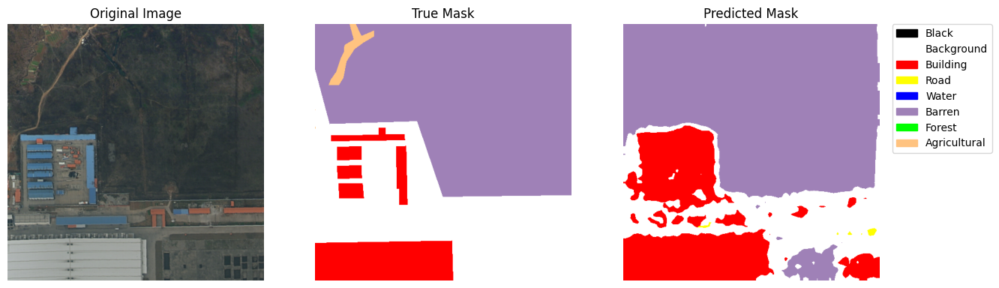

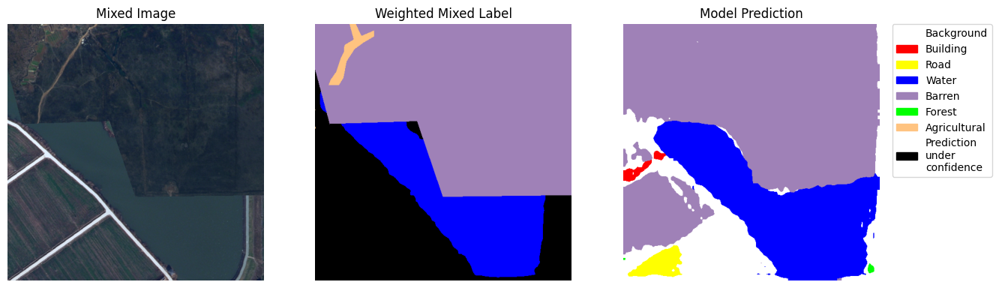

Epoch 2/20: 100%|██████████| 85/85 [02:34<00:00,  1.82s/it]


Epoch 2, Average Loss: 1.2979, Learning Rate: 0.010000


IoU per category (%):
 Background: 39.34%
 Building: 28.87%
 Road: 21.10%
 Water: 29.44%
 Barren: 8.13%
 Forest: 16.02%
 Agricultural: 9.23%

mIoU: 21.73%

Validation mIoU: 0.2173
New best mIoU: 0.2173. Model saved in ./checkpoints/best_model_image_to_image_optWL_multiStepLR_FocalLoss.pth
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2]
Unique values ​​of the predicted mask: [0 1 2 5]



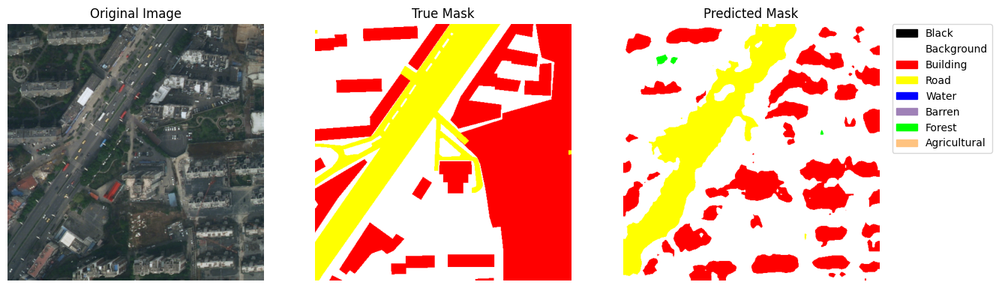

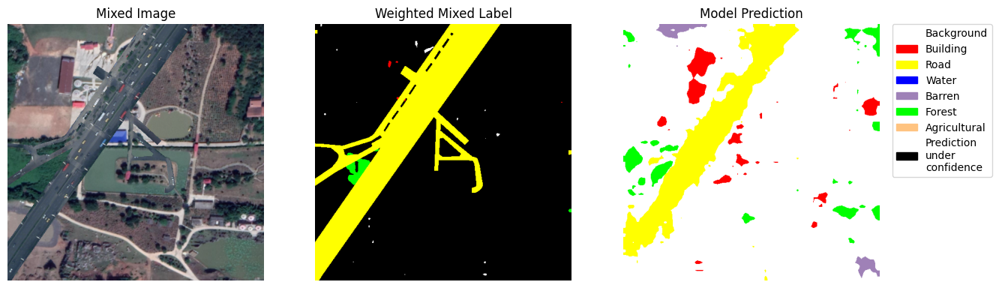

Epoch 3/20: 100%|██████████| 85/85 [02:37<00:00,  1.85s/it]


Epoch 3, Average Loss: 1.2309, Learning Rate: 0.010000


IoU per category (%):
 Background: 43.16%
 Building: 21.54%
 Road: 21.16%
 Water: 25.43%
 Barren: 7.17%
 Forest: 19.91%
 Agricultural: 12.04%

mIoU: 21.48%

Validation mIoU: 0.2148
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 4 5]
Unique values ​​of the predicted mask: [0 1 2 4]



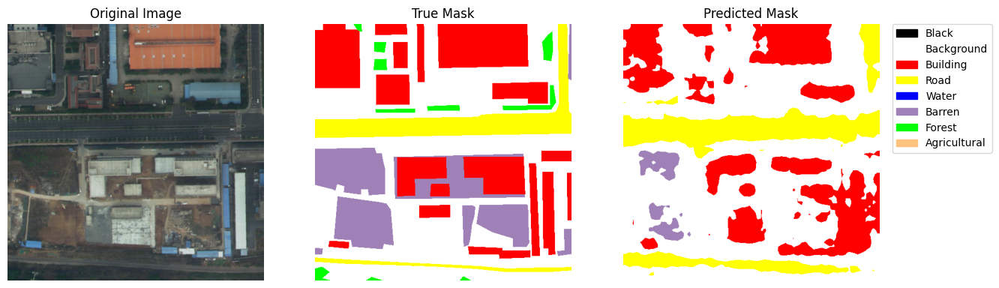

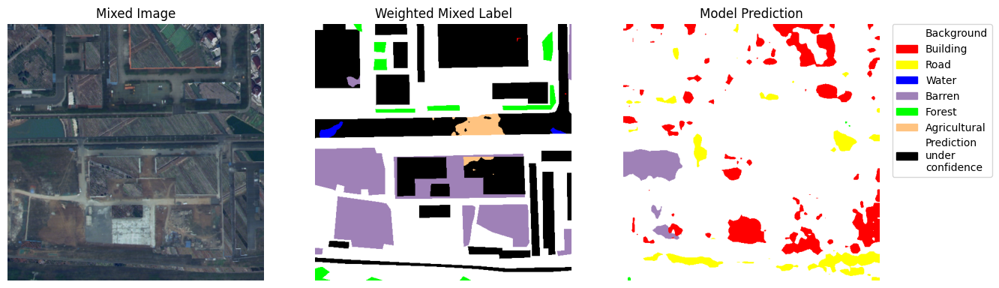

Epoch 4/20: 100%|██████████| 85/85 [02:29<00:00,  1.76s/it]


Epoch 4, Average Loss: 1.2127, Learning Rate: 0.010000


IoU per category (%):
 Background: 47.39%
 Building: 26.55%
 Road: 22.59%
 Water: 33.46%
 Barren: 8.84%
 Forest: 6.50%
 Agricultural: 5.55%

mIoU: 21.55%

Validation mIoU: 0.2155
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [-1  0  1  2  3  5]
Unique values ​​of the predicted mask: [0 1 2 3 5]



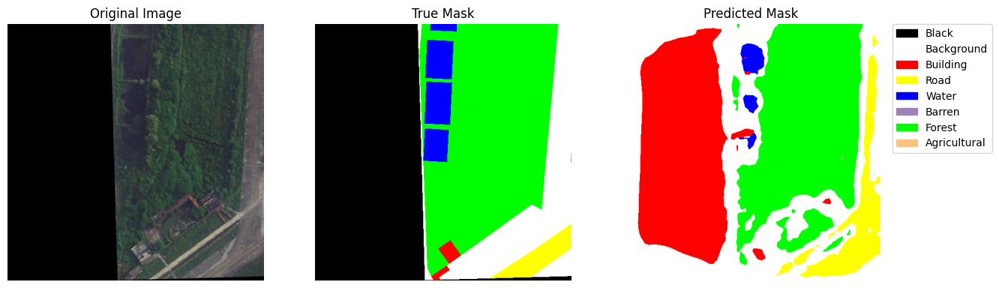

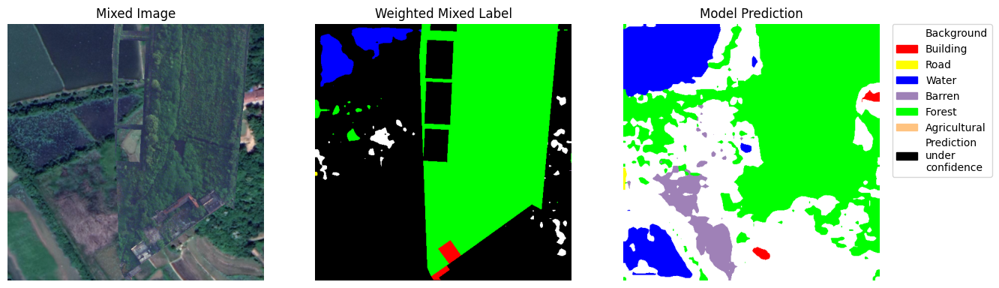

Epoch 5/20: 100%|██████████| 85/85 [02:35<00:00,  1.83s/it]


Epoch 5, Average Loss: 1.1822, Learning Rate: 0.010000


IoU per category (%):
 Background: 48.44%
 Building: 24.11%
 Road: 18.91%
 Water: 35.06%
 Barren: 7.44%
 Forest: 5.92%
 Agricultural: 13.02%

mIoU: 21.84%

Validation mIoU: 0.2184
New best mIoU: 0.2184. Model saved in ./checkpoints/best_model_image_to_image_optWL_multiStepLR_FocalLoss.pth
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 4 5]
Unique values ​​of the predicted mask: [0 1 2 4 5]



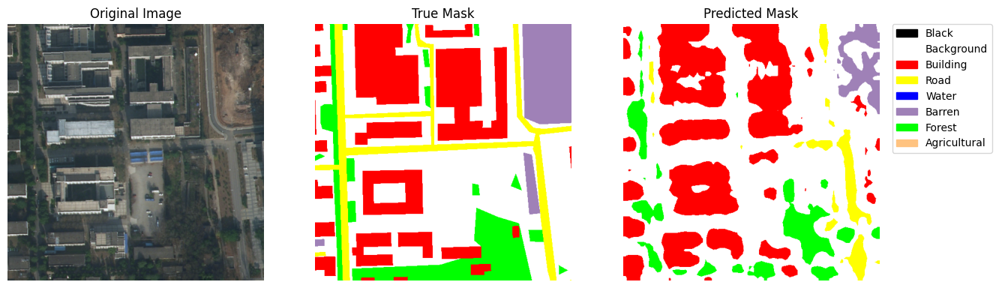

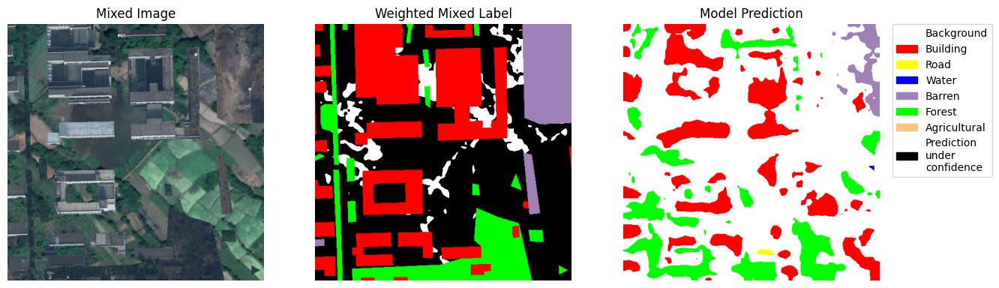

Epoch 6/20: 100%|██████████| 85/85 [02:33<00:00,  1.80s/it]


Epoch 6, Average Loss: 1.1460, Learning Rate: 0.010000


IoU per category (%):
 Background: 48.30%
 Building: 24.14%
 Road: 21.67%
 Water: 33.46%
 Barren: 11.09%
 Forest: 5.16%
 Agricultural: 9.17%

mIoU: 21.85%

Validation mIoU: 0.2185
New best mIoU: 0.2185. Model saved in ./checkpoints/best_model_image_to_image_optWL_multiStepLR_FocalLoss.pth
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [-1  0  1  2  3  4  5]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



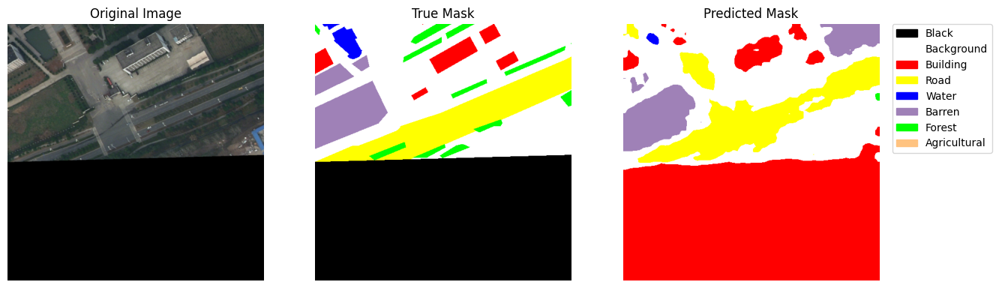

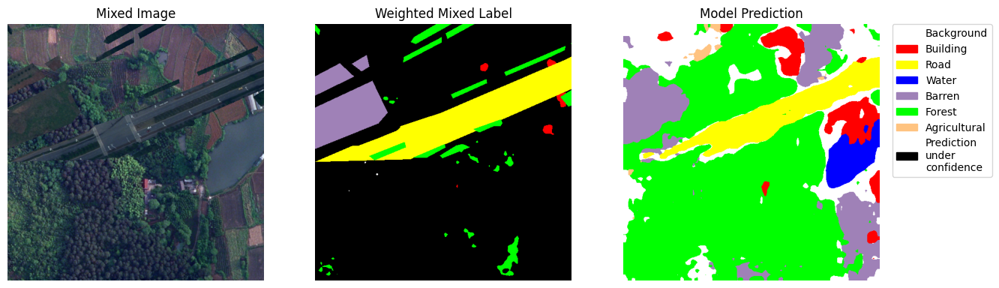

Epoch 7/20: 100%|██████████| 85/85 [02:33<00:00,  1.80s/it]


Epoch 7, Average Loss: 1.1129, Learning Rate: 0.010000


IoU per category (%):
 Background: 47.82%
 Building: 29.54%
 Road: 18.99%
 Water: 33.54%
 Barren: 8.87%
 Forest: 5.75%
 Agricultural: 10.67%

mIoU: 22.17%

Validation mIoU: 0.2217
New best mIoU: 0.2217. Model saved in ./checkpoints/best_model_image_to_image_optWL_multiStepLR_FocalLoss.pth
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 3 4 5]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



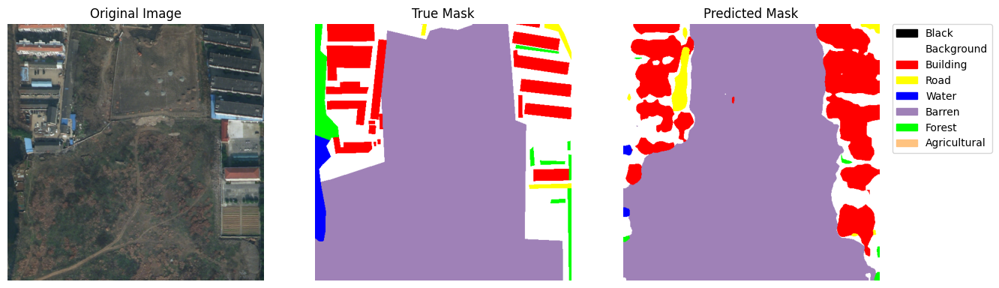

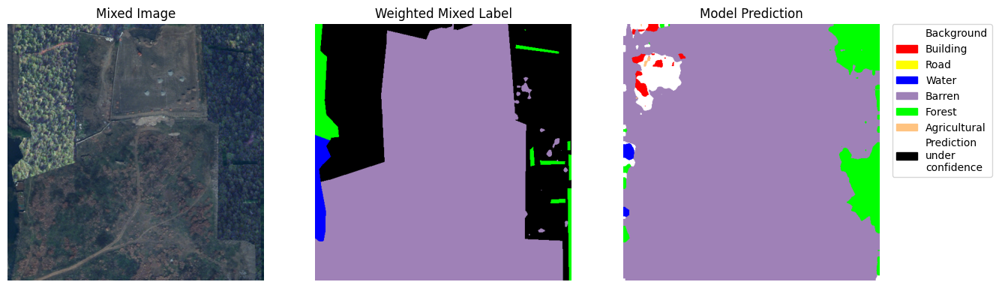

Epoch 8/20: 100%|██████████| 85/85 [02:35<00:00,  1.83s/it]


Epoch 8, Average Loss: 1.0929, Learning Rate: 0.010000


IoU per category (%):
 Background: 47.52%
 Building: 27.13%
 Road: 20.28%
 Water: 36.57%
 Barren: 7.71%
 Forest: 5.92%
 Agricultural: 7.36%

mIoU: 21.78%

Validation mIoU: 0.2178
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [-1  0  1  2  4]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



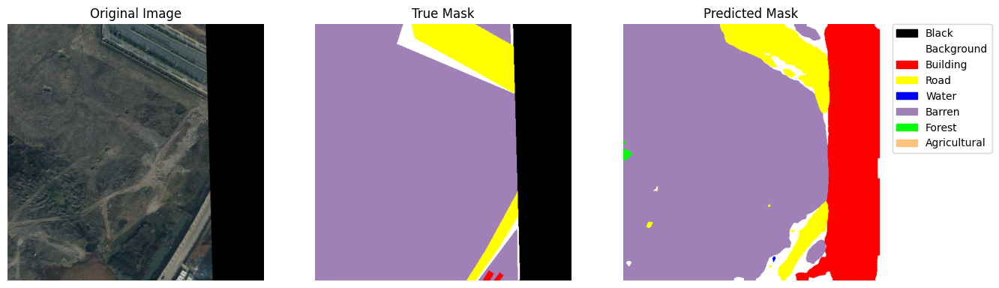

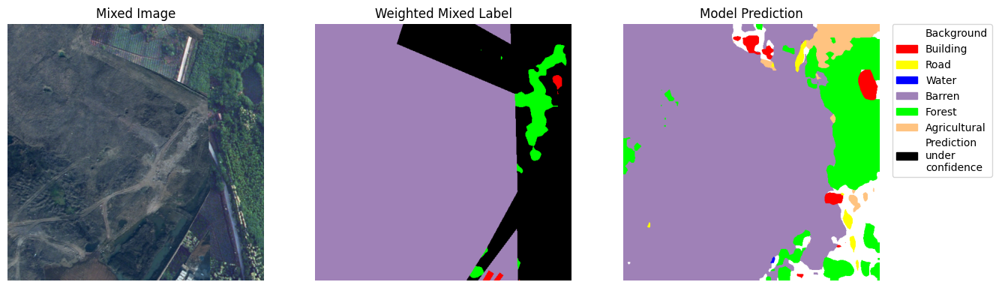

Epoch 9/20: 100%|██████████| 85/85 [02:35<00:00,  1.83s/it]


Epoch 9, Average Loss: 1.0841, Learning Rate: 0.010000


IoU per category (%):
 Background: 47.29%
 Building: 25.64%
 Road: 23.63%
 Water: 35.30%
 Barren: 8.85%
 Forest: 7.22%
 Agricultural: 7.37%

mIoU: 22.19%

Validation mIoU: 0.2219
New best mIoU: 0.2219. Model saved in ./checkpoints/best_model_image_to_image_optWL_multiStepLR_FocalLoss.pth
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 3 4 5 6]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



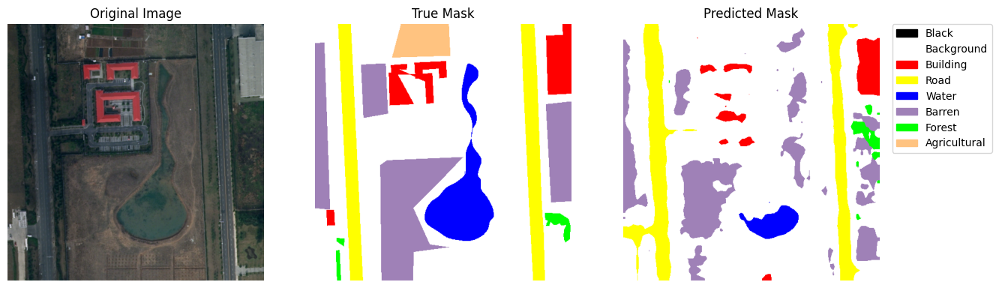

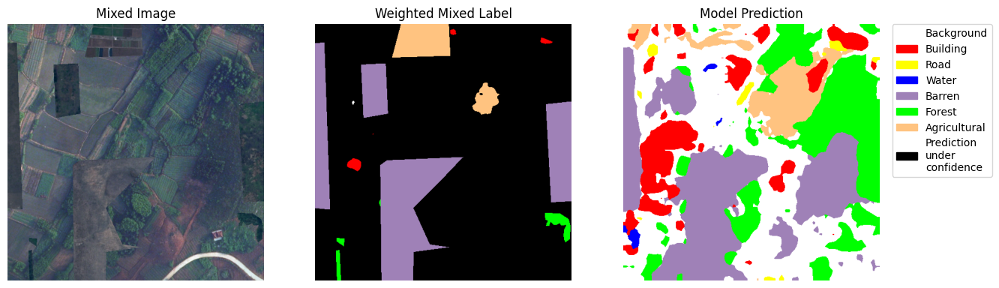

Epoch 10/20: 100%|██████████| 85/85 [02:33<00:00,  1.81s/it]


Epoch 10, Average Loss: 1.1008, Learning Rate: 0.001000


IoU per category (%):
 Background: 49.43%
 Building: 24.83%
 Road: 28.93%
 Water: 34.28%
 Barren: 12.91%
 Forest: 5.12%
 Agricultural: 11.73%

mIoU: 23.89%

Validation mIoU: 0.2389
New best mIoU: 0.2389. Model saved in ./checkpoints/best_model_image_to_image_optWL_multiStepLR_FocalLoss.pth
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 3]
Unique values ​​of the predicted mask: [0 1 2 3 5]



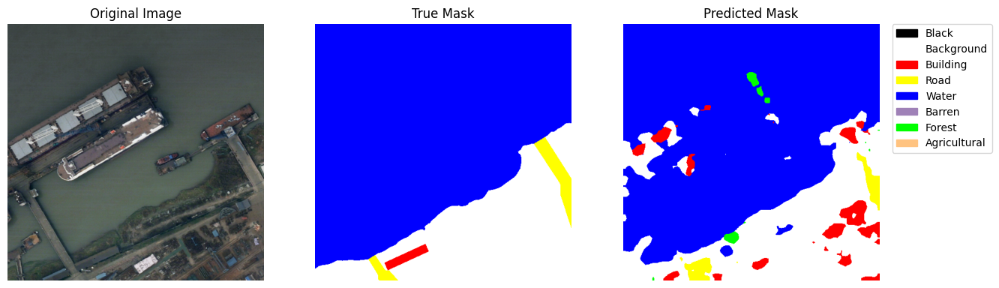

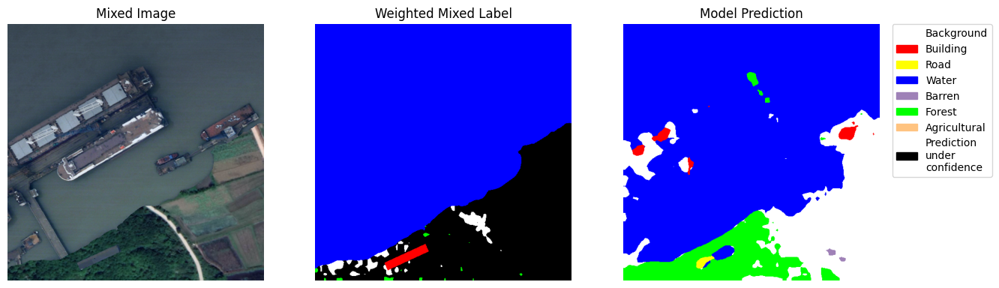

Epoch 11/20: 100%|██████████| 85/85 [02:37<00:00,  1.85s/it]


Epoch 11, Average Loss: 1.0960, Learning Rate: 0.001000


IoU per category (%):
 Background: 48.36%
 Building: 29.04%
 Road: 23.32%
 Water: 34.04%
 Barren: 9.94%
 Forest: 7.66%
 Agricultural: 8.60%

mIoU: 22.99%

Validation mIoU: 0.2299
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 4 5]
Unique values ​​of the predicted mask: [0 1 2 4 5]



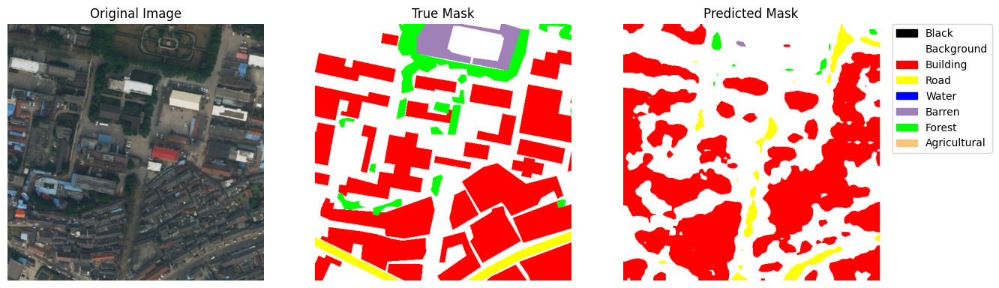

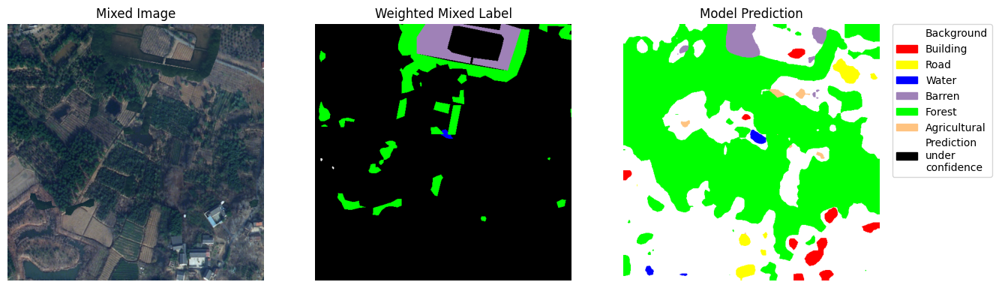

Epoch 12/20: 100%|██████████| 85/85 [02:34<00:00,  1.81s/it]


Epoch 12, Average Loss: 1.1109, Learning Rate: 0.001000


IoU per category (%):
 Background: 48.35%
 Building: 27.15%
 Road: 22.28%
 Water: 33.88%
 Barren: 9.78%
 Forest: 5.23%
 Agricultural: 8.30%

mIoU: 22.14%

Validation mIoU: 0.2214
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 4 5]
Unique values ​​of the predicted mask: [0 1 2 4 5]



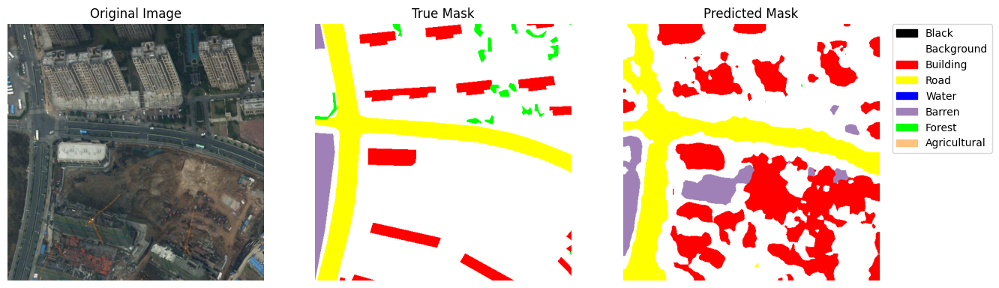

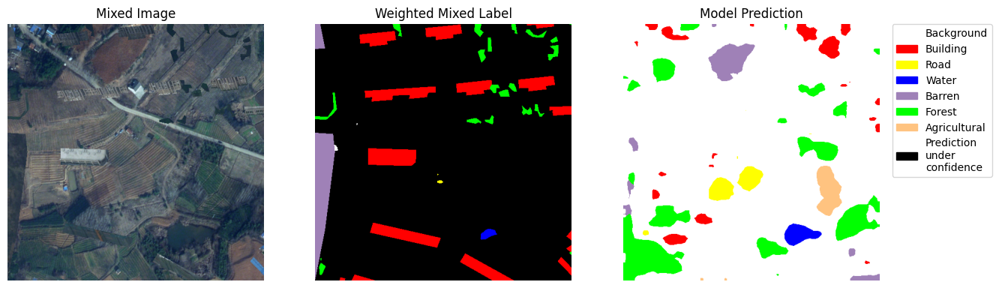

Epoch 13/20: 100%|██████████| 85/85 [02:36<00:00,  1.85s/it]


Epoch 13, Average Loss: 1.1120, Learning Rate: 0.001000


IoU per category (%):
 Background: 48.58%
 Building: 26.08%
 Road: 21.80%
 Water: 34.84%
 Barren: 10.04%
 Forest: 5.63%
 Agricultural: 8.26%

mIoU: 22.18%

Validation mIoU: 0.2218
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 4]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



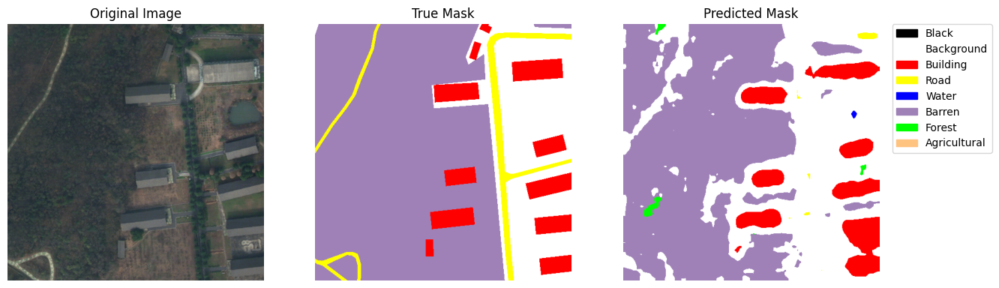

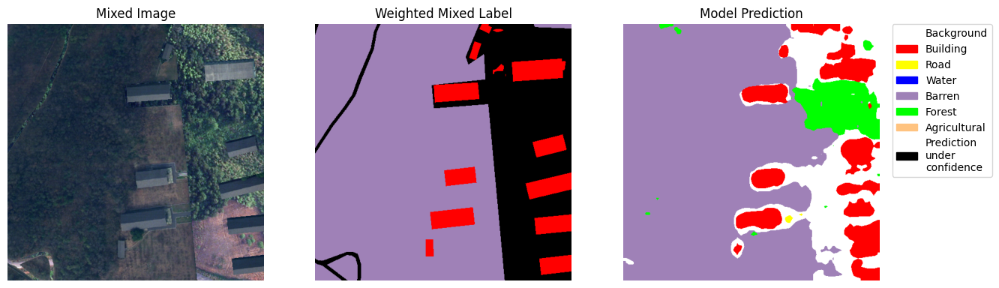

Epoch 14/20: 100%|██████████| 85/85 [02:34<00:00,  1.82s/it]


Epoch 14, Average Loss: 1.1271, Learning Rate: 0.001000


IoU per category (%):
 Background: 48.12%
 Building: 28.56%
 Road: 21.41%
 Water: 34.84%
 Barren: 9.89%
 Forest: 6.43%
 Agricultural: 7.58%

mIoU: 22.41%

Validation mIoU: 0.2241
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 3 4 5 6]
Unique values ​​of the predicted mask: [0 1 2 4 5 6]



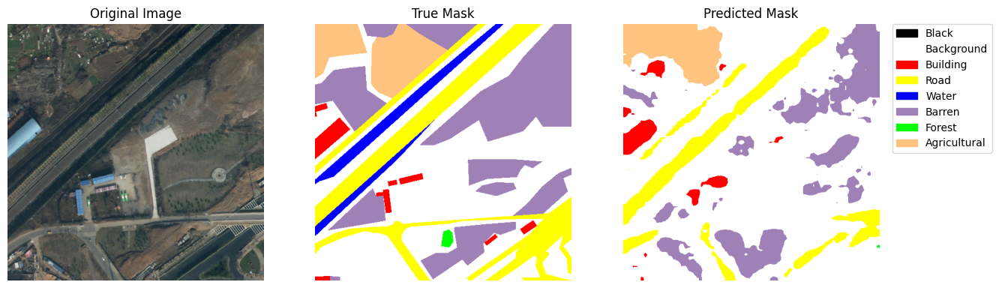

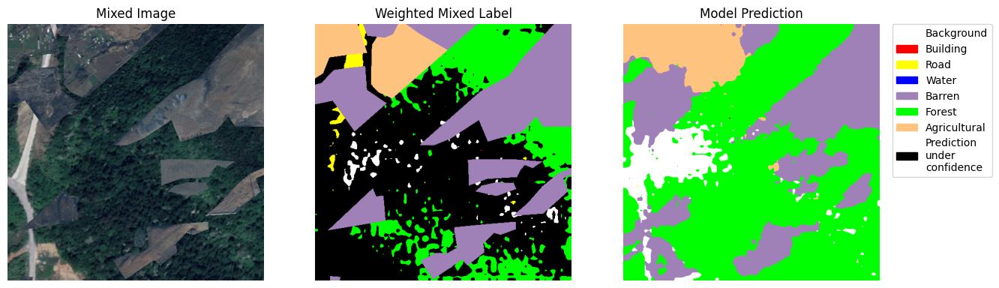

Epoch 15/20: 100%|██████████| 85/85 [02:33<00:00,  1.81s/it]


Epoch 15, Average Loss: 1.1257, Learning Rate: 0.000100


IoU per category (%):
 Background: 48.10%
 Building: 26.31%
 Road: 21.93%
 Water: 35.50%
 Barren: 9.44%
 Forest: 6.00%
 Agricultural: 7.99%

mIoU: 22.18%

Validation mIoU: 0.2218
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 3 4 5]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



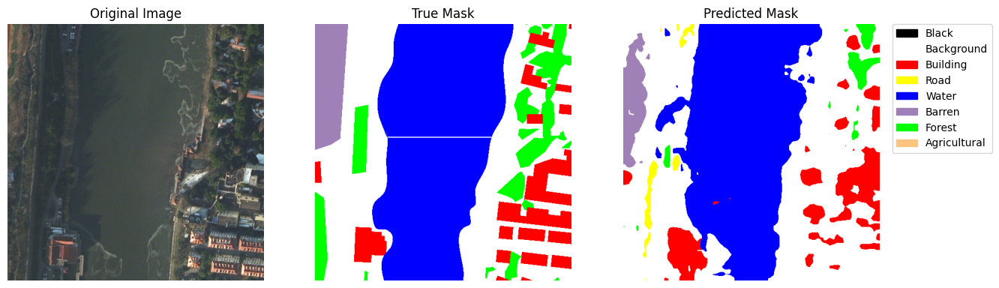

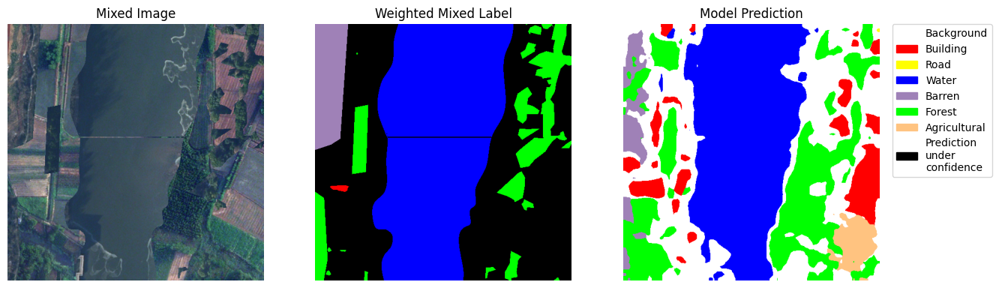

Epoch 16/20: 100%|██████████| 85/85 [02:37<00:00,  1.85s/it]


Epoch 16, Average Loss: 1.1416, Learning Rate: 0.000100


IoU per category (%):
 Background: 48.26%
 Building: 26.91%
 Road: 22.08%
 Water: 35.64%
 Barren: 10.37%
 Forest: 6.62%
 Agricultural: 8.67%

mIoU: 22.65%

Validation mIoU: 0.2265
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 3 4 5]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



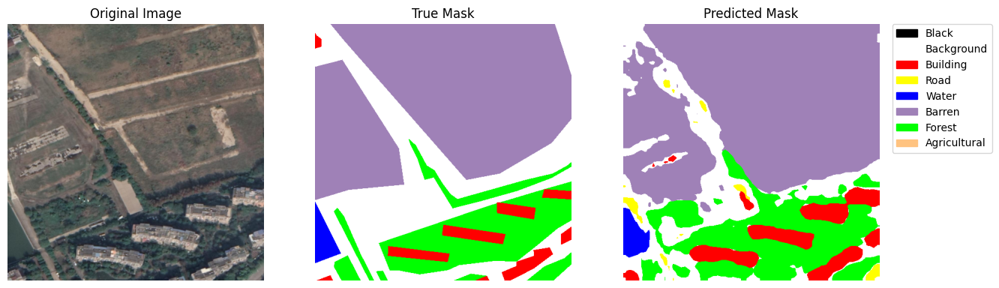

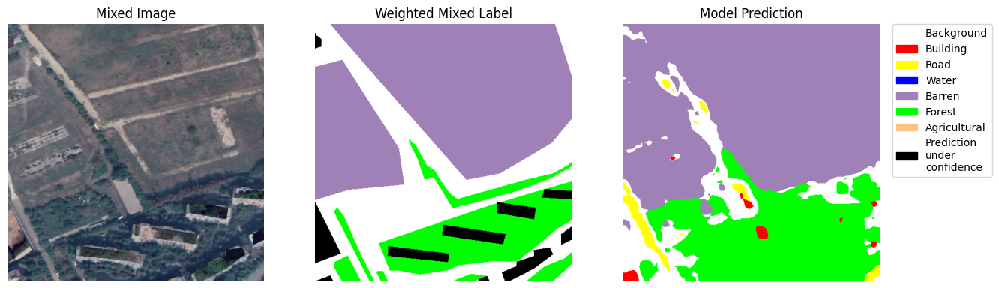

Epoch 17/20: 100%|██████████| 85/85 [02:39<00:00,  1.87s/it]


Epoch 17, Average Loss: 1.1535, Learning Rate: 0.000100


IoU per category (%):
 Background: 47.99%
 Building: 26.42%
 Road: 21.60%
 Water: 34.21%
 Barren: 10.30%
 Forest: 5.68%
 Agricultural: 8.07%

mIoU: 22.04%

Validation mIoU: 0.2204
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 5]
Unique values ​​of the predicted mask: [0 1 2 5]



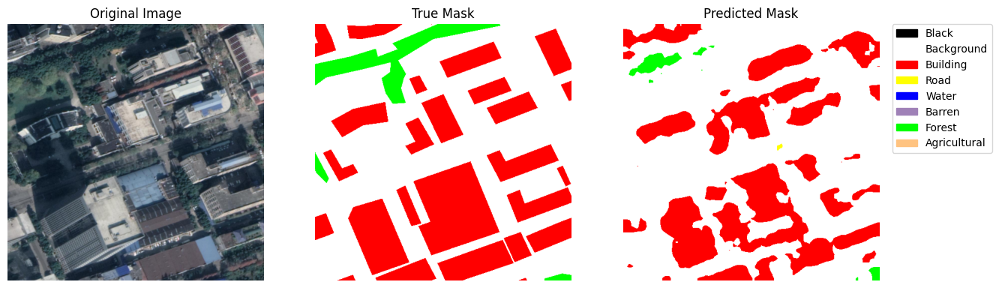

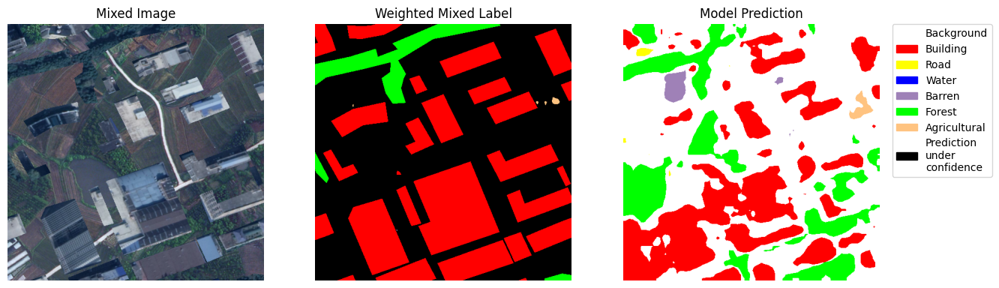

Epoch 18/20: 100%|██████████| 85/85 [02:37<00:00,  1.85s/it]


Epoch 18, Average Loss: 1.1575, Learning Rate: 0.000100


IoU per category (%):
 Background: 48.23%
 Building: 26.37%
 Road: 20.74%
 Water: 35.54%
 Barren: 9.61%
 Forest: 7.22%
 Agricultural: 7.28%

mIoU: 22.14%

Validation mIoU: 0.2214
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 4]
Unique values ​​of the predicted mask: [0 1 2 3 4 5]



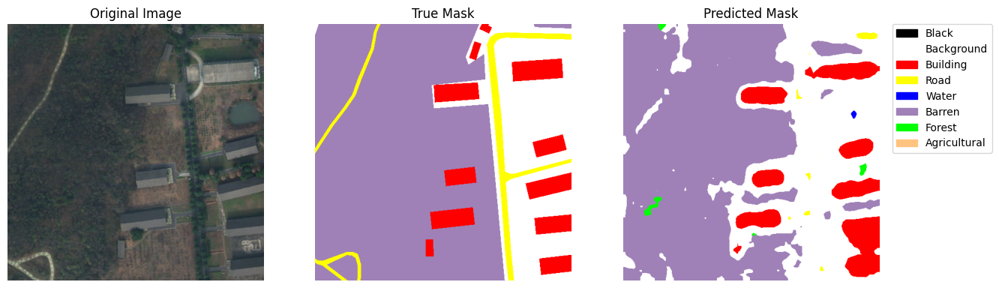

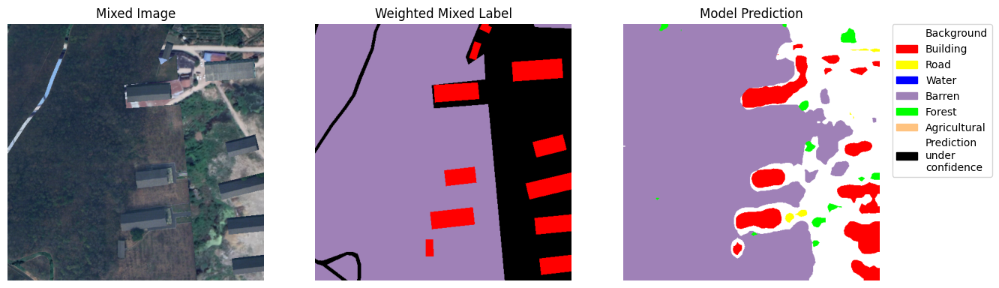

Epoch 19/20: 100%|██████████| 85/85 [02:38<00:00,  1.87s/it]


Epoch 19, Average Loss: 1.1705, Learning Rate: 0.000100


IoU per category (%):
 Background: 48.01%
 Building: 27.01%
 Road: 20.65%
 Water: 35.33%
 Barren: 9.84%
 Forest: 5.59%
 Agricultural: 6.77%

mIoU: 21.88%

Validation mIoU: 0.2188
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 3 4 5]
Unique values ​​of the predicted mask: [0 1 3 4 5]



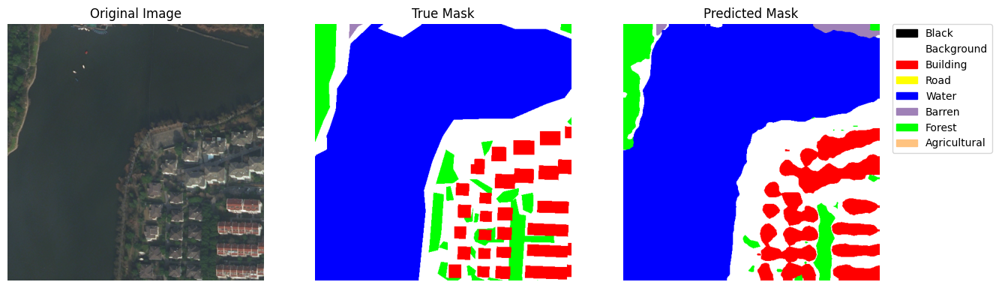

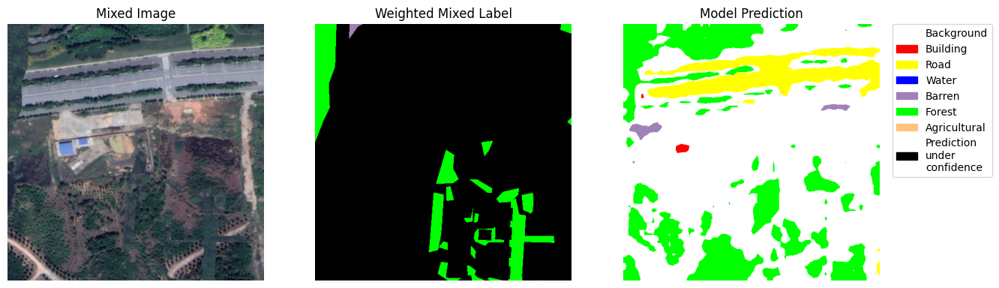

Epoch 20/20: 100%|██████████| 85/85 [02:36<00:00,  1.84s/it]


Epoch 20, Average Loss: 1.1872, Learning Rate: 0.000100


IoU per category (%):
 Background: 48.01%
 Building: 26.52%
 Road: 21.27%
 Water: 34.74%
 Barren: 9.12%
 Forest: 6.89%
 Agricultural: 8.72%

mIoU: 22.18%

Validation mIoU: 0.2218
True mask and prediction comparison for a train sample image:
Unique (mapped) values ​​of the real mask: [0 1 2 5]
Unique values ​​of the predicted mask: [0 1 2 5]



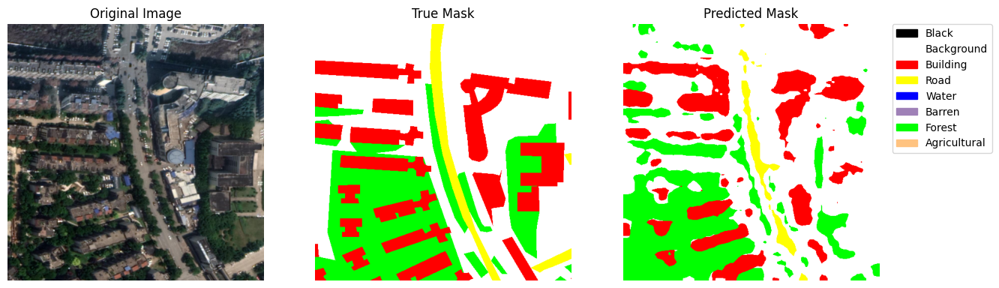

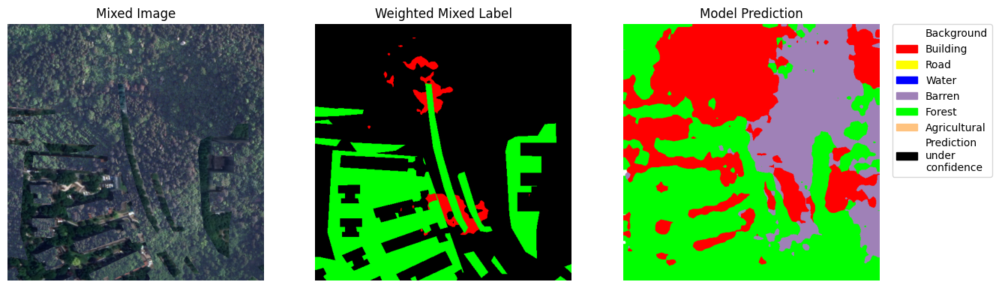

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from tqdm import tqdm
import torch.nn.functional as F

# Directory for checkpoints
checkpoint_dir = "./checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Learning rate scheduler
def poly_lr_scheduler(optimizer, init_lr, iter, max_iter, power=0.9):
    lr = init_lr * (1 - iter / max_iter) ** power
    optimizer.param_groups[0]['lr'] = lr
    return lr

# Initialization of GradScaler and optimizer
scaler = torch.cuda.amp.GradScaler()
optimizer = torch.optim.SGD(model.parameters(), lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
# Set the generator scheduler to MultiStepLR
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=STEP_SIZE, gamma=GAMMA)
#criterion = nn.CrossEntropyLoss(weight = weights, ignore_index=-1)
criterion = FocalLoss(alpha = 1, gamma = 2, ignore_index = -1)

loss_history = []
lr_history = []
miou_history = []

source_iterator = iter(train_loader_source)
target_iterator = iter(train_loader_target)

global_iter = 0
best_mIoU = 0

augmentations = DataAugmentation(probability=0.5)

if trained == False:
    for epoch in range(NUM_EPOCHS):
        model.train()
        total_loss = 0.0

        for _ in tqdm(range(len(train_loader_target)), desc=f"Epoch {epoch + 1}/{NUM_EPOCHS}"):
            try:
                source_batch = next(source_iterator)
            except StopIteration:
                # Reset source iterator if exhausted
                source_iterator = iter(train_loader_source)
                source_batch = next(source_iterator)

            try:
                target_batch = next(target_iterator)
            except StopIteration:
                # Reset target iterator if exhausted
                target_iterator = iter(train_loader_target)
                target_batch = next(target_iterator)

            # Prepare images and labels
            source_images, source_labels = source_batch
            target_images, _ = target_batch

            source_images = source_images.to(device)
            source_labels = source_labels.to(device)
            target_images = target_images.to(device)

            with torch.no_grad():
                target_outputs = model(target_images)
                pseudo_labels, confidence_weights = generate_pseudo_labels(
                    target_outputs, epoch=epoch
                )

            # Interpolate pseudo_labels and confidence_weights if dimensions differ
            pseudo_labels = F.interpolate(
                pseudo_labels.unsqueeze(1).float(),
                size=(source_labels.size(1), source_labels.size(2)),
                mode='nearest'
            ).squeeze(1).long()

            confidence_weights = F.interpolate(
                confidence_weights.unsqueeze(1).float(),
                size=(source_labels.size(1), source_labels.size(2)),
                mode='nearest'
            ).squeeze(1).float()

            # Generate mixed images and labels using ClassMix, also obtaining the source mask and weights
            mixed_images, mixed_labels, selected_classes, weights_2 = class_mix_batches(
                source_batch=source_images,
                source_labels=source_labels,
                target_batch=target_images,
                target_pseudo_labels=pseudo_labels,
                confidence_weights=confidence_weights,
                avoid_classes=[-1],
            )

            conf_weights_expanded = torch.cat([
                torch.ones_like(weights_2),
                weights_2
            ], dim=0).to(device)

            # Apply data augmentations to source images
            aug_images, aug_labels = augmentations(source_images, source_labels)
            # Apply data augmentations to mixed images
            aug_mixed_images, aug_mixed_labels = augmentations(mixed_images, mixed_labels)

            final_images = torch.cat((aug_images, aug_mixed_images), dim=0)
            final_labels = torch.cat((aug_labels, aug_mixed_labels), dim=0)

            final_images = final_images.to(device)
            final_labels = final_labels.to(device)

            # Training step
            optimizer.zero_grad()
            with torch.amp.autocast('cuda'):
                outputs = model(final_images)  # [2B, C, H_out, W_out]
                outputs_resized = F.interpolate(outputs, size=(512, 512), mode='bilinear', align_corners=False)

                # Compute a single loss
                #loss_all = criterion(outputs_resized, final_labels)
                #loss = torch.mean(loss_all * conf_weights_expanded)
                loss = criterion(outputs_resized, final_labels, mask=conf_weights_expanded)

            # Backpropagation
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # Accumulate loss
            total_loss += loss.item()

        # Aggiornare il learning rate con lo scheduler MultiStepLR per il generatore
        scheduler.step()  # Questo aggiorna il learning rate per il generatore
        lr = optimizer.param_groups[0]['lr']
        lr_history.append(lr)

        # Compute the average loss of the epoch
        avg_loss = total_loss / len(train_loader_target)
        loss_history.append(avg_loss)

        print()
        print(f"Epoch {epoch + 1}, Average Loss: {avg_loss:.4f}, Learning Rate: {lr:.6f}")

        # Validation
        validate = True
        if validate:
            model.eval()
            mIoU = compute_mIoU(model, val_loader, num_classes=NUM_CLASSES, device=device)
            miou_history.append(mIoU)
            print(f"Validation mIoU: {mIoU:.4f}")

            # Save the model if mIoU improves
            if mIoU > best_mIoU:
                best_mIoU = mIoU
                torch.save(model.state_dict(), f'best_model_image_to_image_optFocalLoss_multiStepLR.pth')
                checkpoint_path = os.path.join(checkpoint_dir, f'best_model_image_to_image_optFocalLoss_multiStepLR.pth')
                torch.save(model.state_dict(), checkpoint_path)
                print(f"New best mIoU: {best_mIoU:.4f}. Model saved in {checkpoint_path}")

        # Debugging: visualize an image and mask (optional)
        model.eval()
        with torch.no_grad():
            # Get a sample from the source dataset
            try:
                source_sample = next(iter(train_loader_source))
            except StopIteration:
                source_sample = next(iter(train_loader_source))
            source_img, source_lbl = source_sample
            s_img = source_img[0].to(device)
            s_lbl = source_lbl[0].to(device)

            # Model prediction for the source
            s_pred = model(s_img.unsqueeze(0))
            s_pred = F.interpolate(s_pred, size=(512, 512), mode='bilinear', align_corners=False)
            s_pred = torch.argmax(s_pred, dim=1).squeeze(0)

            # Visualize source image, label, and prediction
            visualize_prediction(s_img.cpu(), s_lbl.cpu(), s_pred.cpu())

            # Select a sample from the target loader
            try:
                target_sample = next(iter(train_loader_target))
            except StopIteration:
                target_sample = next(iter(train_loader_target))
            target_img, _ = target_sample
            t_img = target_img[0].to(device)

            # Generate pseudo label and confidence_weights for the sample
            t_img_unsqueezed = t_img.unsqueeze(0)
            target_output = model(t_img_unsqueezed)
            target_output_resized = F.interpolate(target_output, size=(512, 512), mode='bilinear', align_corners=False)

            pseudo_label_sample, confidence_weights_sample = generate_pseudo_labels(
                    target_output_resized, epoch=epoch
            )

            # Resize pseudo labels and confidence weights
            pseudo_label_sample = F.interpolate(
                pseudo_label_sample.unsqueeze(1).float(),
                size=(512, 512),
                mode='nearest'
            ).squeeze(1).long()
            confidence_weights_sample = F.interpolate(
                confidence_weights_sample.unsqueeze(1).float(),
                size=(512, 512),
                mode='nearest'
            ).squeeze(1).float()

            mixed_images, mixed_labels, selected_classes, weights_3 = class_mix_batches(
                source_batch=s_img.unsqueeze(0),
                source_labels=s_lbl.unsqueeze(0),
                target_batch=t_img_unsqueezed,
                target_pseudo_labels=pseudo_label_sample,
                confidence_weights=confidence_weights_sample,
                avoid_classes=[-1],
            )

            visualize_mixed_data(mixed_images, mixed_labels, weights_3, model, device)

            trained = True
            plot_training = True
else:
    print("Model already trained")
    model.load_state_dict(torch.load("/content/best_model_image_to_image_optFocalLoss_multiStepLR.pth", weights_only=True))
    model.to(device)

# **Results**

In [ ]:
model.load_state_dict(torch.load("/content/best_model_image_to_image_optFocalLoss_multiStepLR.pth", weights_only=True))
model.to(device)

mIoU = compute_mIoU(model, val_loader, num_classes=NUM_CLASSES, device=device)

IoU per category (%):
 Background: 49.43%
 Building: 24.83%
 Road: 28.93%
 Water: 34.28%
 Barren: 12.91%
 Forest: 5.12%
 Agricultural: 11.73%

mIoU: 23.89%



## Final graph

In [ ]:
import matplotlib.pyplot as plt

def plot_training_metrics(loss_history, lr_history, miou_history):
    """
    Function to plot loss, learning rate, and mIoU graph.

    Parameters:
    - loss_history: list containing loss values for each epoch.
    - lr_history: list containing learning rate values for each epoch.
    - miou_history: list containing mIoU values calculated every 5 epochs.
    """
    plt.figure(figsize=(18, 6))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(loss_history, label='Loss', color='blue')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()
    plt.xticks(range(len(loss_history)))  # Set xticks as integer numbers

    # Learning Rate plot
    plt.subplot(1, 3, 2)
    plt.plot(lr_history, label='Learning Rate', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate')
    plt.legend()
    plt.xticks(range(len(lr_history)))  # Set xticks as integer numbers

    # mIoU plot
    plt.subplot(1, 3, 3)
    plt.plot(miou_history, label='mIoU', color='green')
    plt.xlabel('Epoch')
    plt.ylabel('mIoU')
    plt.title('Mean IoU')
    plt.legend()
    plt.xticks(range(len(miou_history)))  # Integer ticks every 5 epochs

    plt.tight_layout()
    plt.show()

    plot_training_metrics(loss_history, lr_history, miou_history)